<!--HEADER-->
*Notas de aula de Modelagem Matemática - 2020/2 [- Ricardo M. S. Rosa (IM/UFRJ)](http://www.im.ufrj.br/rrosa)*

<!--BADGES-->
<a href="https://nbviewer.jupyter.org/github/rmsrosa/modelagem_matematica/blob/modmat2020p2/notas_de_aula/30.00-Series_Fourier_compressao_audio.ipynb" target="_blank"><img align="left" src="https://img.shields.io/badge/view%20in-nbviewer-orange" alt="View in NBViewer" title="View in NBViewer"></a><a href="https://mybinder.org/v2/gh/rmsrosa/modelagem_matematica/julia-env-for-binder?urlpath=git-pull%3Frepo%3Dhttps%253A%252F%252Fgithub.com%252Frmsrosa%252Fmodelagem_matematica%26branch%3Dmodmat2020p2%26urlpath%3Dtree%252Fmodelagem_matematica%252Fnotas_de_aula/30.00-Series_Fourier_compressao_audio.ipynb" target="_blank"><img align="left" src="https://mybinder.org/badge.svg" alt="Open in binder" title="Open in binder"></a><a href="https://nbviewer.jupyter.org/github/rmsrosa/modelagem_matematica/blob/modmat2020p2/notas_de_aula/slides/30.00-Series_Fourier_compressao_audio.slides.html" target="_blank"><img align="left" src="https://img.shields.io/badge/view-slides-darkgreen" alt="View Slides" title="View Slides"></a>&nbsp;

<!--NAVIGATOR-->
[<- 29. Séries de Fourier](29.00-Series_Fourier.ipynb) | [Página inicial](00.00-Pagina_inicial.ipynb) 

---


# Aplicações de séries de Fourier à compressão de áudio

In [70]:
using FFTW
using WAV
using DSP
using SampledSignals
using Plots

In [3]:
audio_one_channel = SampleBuf(rand(100000), 10000)

100000-frame, 1-channel SampleBuf{Float64, 1}
10.0s sampled at 10000.0Hz
▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇

In [4]:
audio_two_channel = SampleBuf(rand(100000,2), 10000)

100000-frame, 2-channel SampleBuf{Float64, 2}
10.0s sampled at 10000.0Hz
▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇

In [5]:
audio_multi_channel = SampleBuf(rand(100000,2), 10000)

100000-frame, 2-channel SampleBuf{Float64, 2}
10.0s sampled at 10000.0Hz
▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇

In [9]:
typeof(audio_one_channel.data)

Vector{Float64} (alias for Array{Float64, 1})

In [12]:
sizeof(audio_one_channel)

16

In [13]:
size(audio_one_channel)

(100000,)

In [10]:
sizeof(audio_one_channel.data)

800000

In [15]:
audio_one_channel.samplerate

10000.0

In [16]:
squarewave(x::Real) = ifelse(mod2pi(x) < π, 1.0, -1.0)

squarewave (generic function with 1 method)

In [17]:
function squarewave(x::Real, θ::Real)
    0 ≤ θ ≤ 1 || throw(DomainError(θ, "squwarewave(x, θ) is only defined for 0 ≤ θ ≤ 1."))
    ifelse(mod2pi(x) < 2π * θ, 1.0, -1.0)
end

squarewave (generic function with 2 methods)

In [18]:
function trianglewave(x::Real)
    modx = mod2pi(x + π/2)
    ifelse(modx < π, 2modx/π - 1, -2modx/π + 3)
end

trianglewave (generic function with 1 method)

In [19]:
sawtoothwave(x::Real) = rem2pi(x, RoundNearest) / π

sawtoothwave (generic function with 1 method)

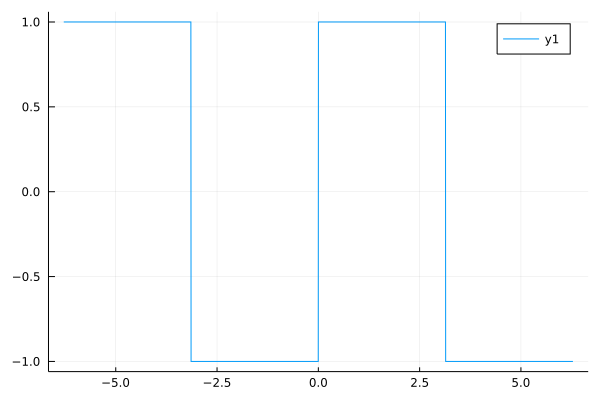

In [24]:
plot([squarewave], -2π, 2π)

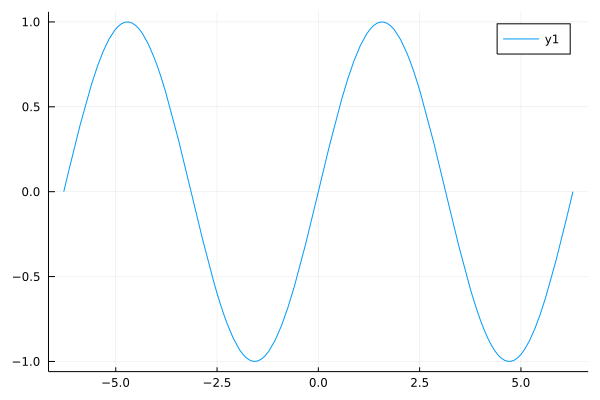

In [25]:
plot([sin], -2π, 2π)

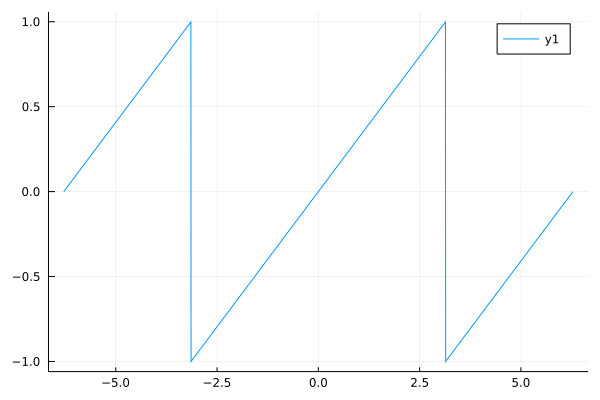

In [26]:
plot([sawtoothwave], -2π, 2π)

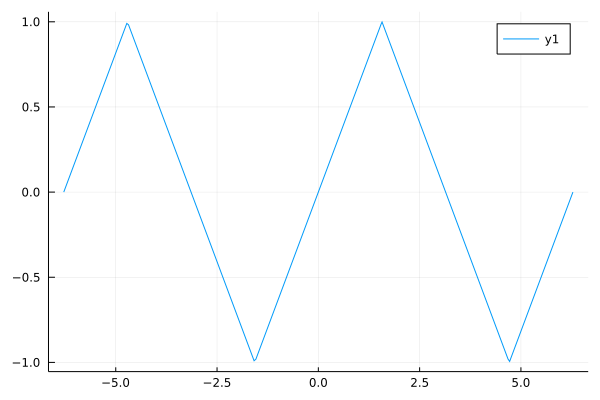

In [28]:
plot([trianglewave], -2π, 2π)

In [29]:
A = .8; phi = π/2; f0= 1000; fs = 44100;

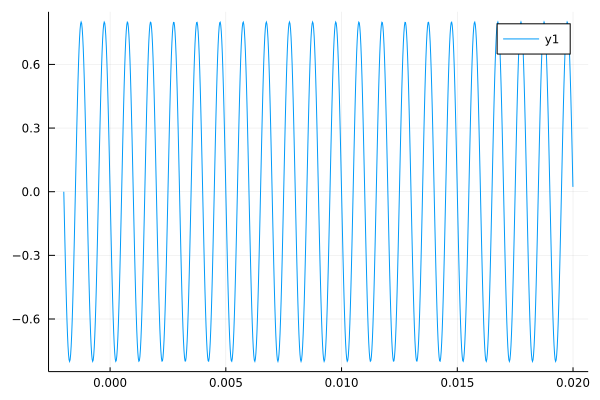

In [42]:
t = -0.002:1/fs:10*0.002
y = A*cos.(2*pi*f0*t .+ phi)
plot(t, y)

In [43]:
wavplay(y, fs)

In [53]:
A1 = .8; A2 = .8; phi1 = π/2; phi2 = π/2; 
f01 = 1000; f02 = 1000; fst = 44100;

In [54]:
tr = -0.002:1/fs:0.002
y1 = A1*sin.(2*pi*f01*tr .+ phi1)
y2 = A2*cos.(2*pi*f02*tr .+ phi2)
addresult =y1 .+ y2
subresult =y1 .- y2
mulresult =y1 .* y2
divresult =y1 ./ y2
wavplay(subresult, fst)	

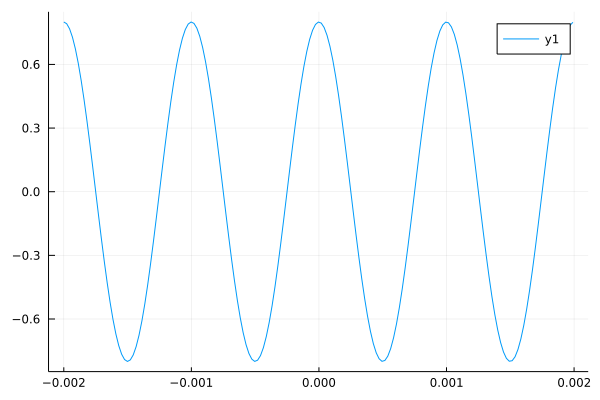

In [55]:
plot(tr, y1)

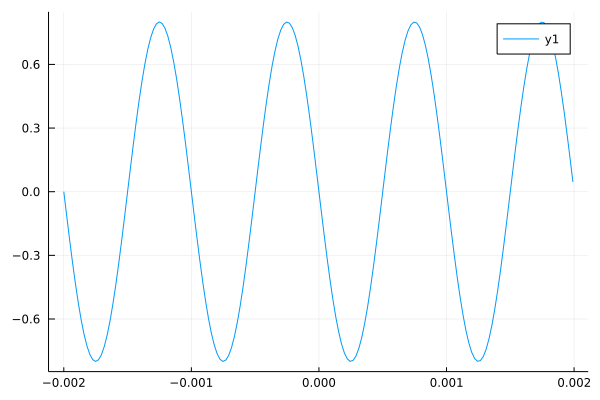

In [56]:
plot(tr, y2)

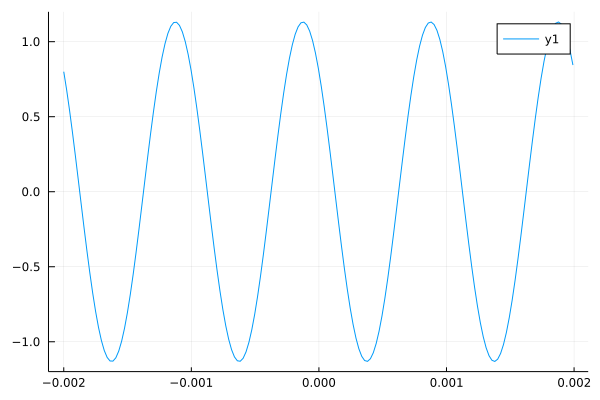

In [57]:
plot(tr, addresult)

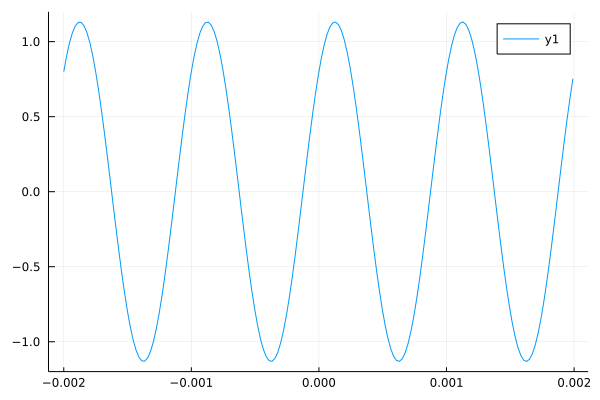

In [58]:
plot(tr, subresult)

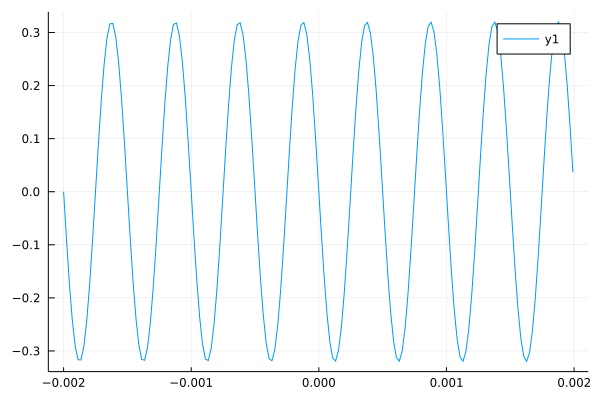

In [59]:
plot(tr, mulresult)

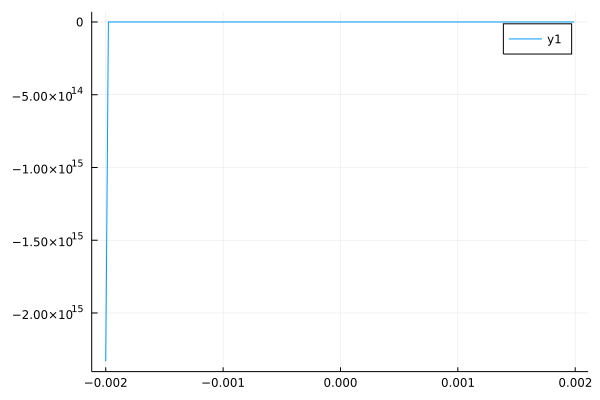

In [60]:
plot(tr, divresult)

In [62]:
wave1, fs1 = wavread(joinpath("data", "piano-phrase.wav"))

In [90]:
wavplay(wave1, fs1)

In [91]:
fs1

44100.0f0

In [65]:
Az = .8; phiz = π/2; fsd = 44100;

In [66]:
tw = 0.0:1/fsd:(length(wave1)-1)/fsd
plot(tw, wave1[:,1])

In [71]:
plot(abs.(fft(wave1)).^2)

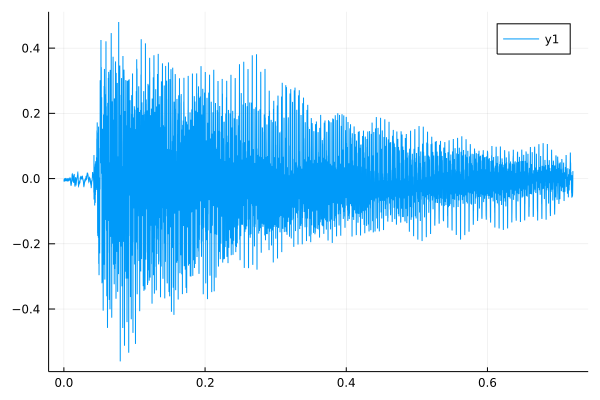

In [72]:
plot(tw[1:div(3end,16)], wave1[1:div(3end,16),1])

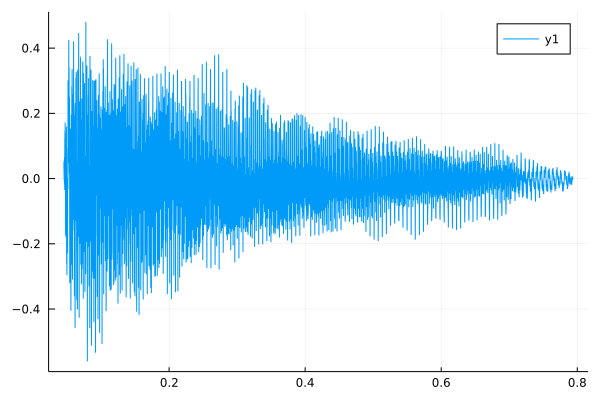

In [73]:
plot(tw[2000:35000], wave1[2000:35000,1])

In [96]:
wavplay(wave1[2000:35000,1], fs1)

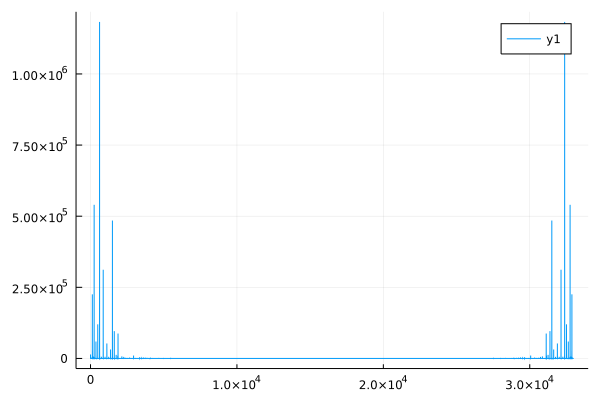

In [100]:
plot(abs.(fft(wave1[2000:35000,1])).^2)

In [77]:
plot(0:1/fs1:(length(wave1)-1)/fs1, wave1, xlabel= "Time [s]")

### Outra parte

In [78]:
Az = .8; phiz = π/2; fsd = 44100;

In [80]:
f0z = 880

tz = 1:1/fsd:11
wavez = Az./tz.*sin.(2*pi*f0z*tz .+ phiz);

In [81]:
wavplay(wavez, fsd)

In [82]:
f1 = 200; f2= 400; f3 = 600; f4 = 800; f5 = 1000;

In [84]:
ta = -0.005:1/fsd:0.005
harmonic1 = A*sin.(2*pi*f1*ta .+ phi)
harmonic2 = A*sin.(2*pi*f2*ta .+ phi)
harmonic3 = A*sin.(2*pi*f3*ta .+ phi)
harmonic4 = A*sin.(2*pi*f4*ta .+ phi)
harmonic5 = A*sin.(2*pi*f5*ta .+ phi)
nothing

In [85]:
wavplay(harmonic5, fsd)	

In [86]:
composite = harmonic1 .+ harmonic2 .+ harmonic3 .+ harmonic4 .+harmonic5
nothing

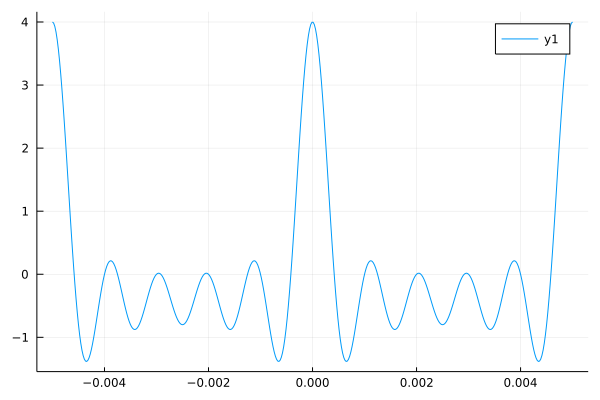

In [87]:
plot(ta,composite)

In [89]:
wavplay(composite, fsd)

<!--NAVIGATOR-->

---
[<- 29. Séries de Fourier](29.00-Series_Fourier.ipynb) | [Página inicial](00.00-Pagina_inicial.ipynb) 